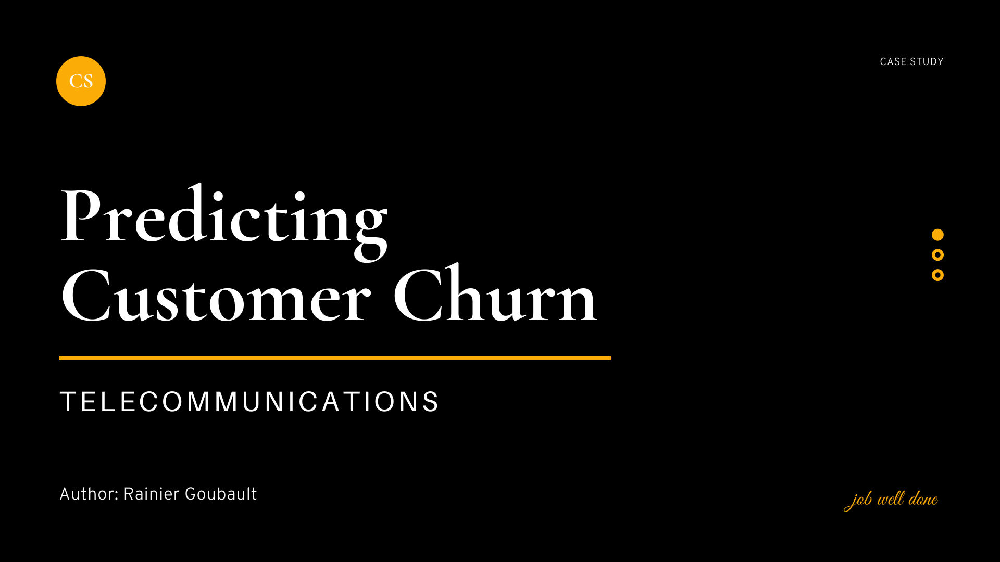

# Business Objective:

**A Tel Co. has a churn problem as 26.5% of it's customers churned in the last month. Telco Co. has contracted job well done on a project to build a predictive model that meets the following business requirements:**

1. Identify and visualize which factors contribute to customer churn.
2. Build a re-usable prediction model pipeline to classify customer churn risk - whether a customer will churn or not, thus making it easier for the Tel Co. to target these 'high-risk' customers as a part of its customer rentention efforts.
3. Explaination of the relative influence that each predictor has on the overall model predictions.
4. Suggest potential solutions to reducing customer churn.

# Execute Summary:

**Tel Co. provided select, historical data on its customers including an indicator as to whether each customer churned in the last month. After analyzing and transforming the data, we optimized several classification models. Each model was trained on 80% of the historical data and then asked to predict churn scores on the remaining 20% test data. Each model was compared with the previous best model with model XGBoost performing the best.**


**Target Variable:**

    - 'Churn'

**Best Model Summary:**

    - Model:
        - XGBoost 
    - Parameters: 
        - 'subsample': 0.2, 
        - 'scale_pos_weight': 4, 
        - 'n_estimators': 450, 
        - 'min_child_weight': 5, 
        - 'max_depth': 3, 
        - 'learning_rate': 0.002, 
        - 'colsample_bytree': 0.2

**Best Model Metrics:**

    - 88.6% mean CV Recall score
    - 68.7% Accuracy test score
    - 75.6% ROC-AUC test score
    - 45.4% Precision test score
    - 90.2% Recall test score
    - 60.4% F1 test score

**This model will be socialized with Tel Co. and refined based on feedback before moving towards deployment.**

# Load Libraries

In [1]:
# Warning
import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")

# Data Manipulation
import numpy as np 
import pandas as pd

# Statistics
from scipy import stats
import scipy.stats as stats
from scipy.stats import norm, skew
from scipy.stats import mannwhitneyu

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

import cufflinks as cf

import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from plotly.offline import iplot
from plotly.subplots import make_subplots

# Preprocessing 
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier

from xgboost import XGBClassifier
from xgboost import plot_importance

from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Model Evaluation
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_score

# Metrics
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, roc_curve, plot_roc_curve

# Set visualiation options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style('white')

import plotly.io as pio
pio.renderers.default = 'notebook_connected'

cf.go_offline()

# Set notebook options
pd.set_option('display.max_columns', None) # display all columns
pd.set_option('display.max_rows', 100) # display 100 rows
pd.set_option('max_colwidth', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x) # display floats to 3 decimal points


# Set pipeline display options
from sklearn import set_config
set_config(display='diagram')

%load_ext watermark

# Check the version history of libraries imported
print('Libraries version:')
%watermark -iv

Libraries version:
matplotlib: 3.5.0
numpy     : 1.21.4
scipy     : 1.7.3
cufflinks : 0.17.3
seaborn   : 0.11.2
plotly    : 5.4.0
sklearn   : 1.0.1
json      : 2.0.9
pandas    : 1.3.4



# Read the data

In [2]:
raw_data = pd.read_csv('../02-data/customer-churn-telco-rawdata.csv')
df = raw_data.copy()

In [3]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700,151.65,Yes


In [4]:
# Check data types and null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


- The data contains 7,043 entries (i.e. rows). Each entry represents a unique customer.
- The data contains 21 features (i.e. columns). Each feature represents an attribute about the customer.
- The data contains no null (missing) values. We'll check and confirm during EDA.
- The data contains 3 numerical features and 18 categorical features.
- **'TotalCharges'** feature was detected as categorical dtype instead of the expected numerical dtype. This is most likely due to the fact that the values contain string elements. We will convert to the appropriate dtype.

In [5]:
# Convert column names to lowercase
df.columns = df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

## Duplicate Values

In [6]:
# Check the data for duplicate customers
dups = df[df.duplicated(subset=['customerid'])==True]
print(f'{dups.shape[0]} duplicate customerid\'s found')

0 duplicate customerid's found


**Great, no duplicate values found in the data.**

## Constant Values

In [7]:
# Check the data for constant values
constant_values = df.nunique()
constant_values = [i for i,v in enumerate(constant_values) if v ==1]
constant_values

[]

**No constant values found in the data.**

## Unique Values

In [8]:
# Find how many unique values numerical features have
for feature in df.select_dtypes(include='number').columns:
    print(f'{feature} feature has {df[feature].nunique()} unique values.')

seniorcitizen feature has 2 unique values.
tenure feature has 73 unique values.
monthlycharges feature has 1585 unique values.


In [9]:
# Find how many unique values categorical features have
for feature in df.select_dtypes(include='object').columns:
    print(f'{feature} feature has {df[feature].nunique()} unique values.')

customerid feature has 7043 unique values.
gender feature has 2 unique values.
partner feature has 2 unique values.
dependents feature has 2 unique values.
phoneservice feature has 2 unique values.
multiplelines feature has 3 unique values.
internetservice feature has 3 unique values.
onlinesecurity feature has 3 unique values.
onlinebackup feature has 3 unique values.
deviceprotection feature has 3 unique values.
techsupport feature has 3 unique values.
streamingtv feature has 3 unique values.
streamingmovies feature has 3 unique values.
contract feature has 3 unique values.
paperlessbilling feature has 2 unique values.
paymentmethod feature has 4 unique values.
totalcharges feature has 6531 unique values.
churn feature has 2 unique values.


**The *'customerid'* feature contains all unique values, it is unique to customer and thus will not be helpful in modeling. We'll drop irrelevant features.**

In [10]:
# Drop 'customerid' from data
df.drop('customerid', axis=1, inplace=True)

In [11]:
# Convert 'totalcharges' to a numerical data type
df['totalcharges'] = pd.to_numeric(df.totalcharges, errors='coerce')

In [12]:
for col in df.select_dtypes(include='number').columns:
    df[col] = df[col].astype('float64')

In [13]:
df.dtypes

gender               object
seniorcitizen       float64
partner              object
dependents           object
tenure              float64
phoneservice         object
multiplelines        object
internetservice      object
onlinesecurity       object
onlinebackup         object
deviceprotection     object
techsupport          object
streamingtv          object
streamingmovies      object
contract             object
paperlessbilling     object
paymentmethod        object
monthlycharges      float64
totalcharges        float64
churn                object
dtype: object

## Missing Values

In [14]:
df.isna().sum()

gender               0
seniorcitizen        0
partner              0
dependents           0
tenure               0
phoneservice         0
multiplelines        0
internetservice      0
onlinesecurity       0
onlinebackup         0
deviceprotection     0
techsupport          0
streamingtv          0
streamingmovies      0
contract             0
paperlessbilling     0
paymentmethod        0
monthlycharges       0
totalcharges        11
churn                0
dtype: int64

**The data does indeed contain missing values. As we see, *'totalcharges'* feature is missing 11 values.**

**Let's explore the missing values further.**

In [15]:
def missing_data(data):
    # Get missing values
    missing = data.isna()
    # Calcualte the total number of missing values
    total_missing = missing.sum().sort_values(ascending=False)
    # Calculate the percentage of missing values
    percent_missing = 100 * (total_missing / missing.count()).sort_values(ascending=False)
    # Combine results into dataframe
    missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total Missing', 'Percent Missing'])
    
    return missing_data

missing = missing_data(df)
missing

,Total Missing,Percent Missing
totalcharges,11,0.156
gender,0,0.000
seniorcitizen,0,0.000
monthlycharges,0,0.000
paymentmethod,0,0.000
paperlessbilling,0,0.000
contract,0,0.000
streamingmovies,0,0.000
streamingtv,0,0.000
techsupport,0,0.000


**Less than 0.2% of it's total values. Not much missing values present.**

**Let's visualize this.**

In [16]:
px.bar(missing, x=missing.index, y=missing['Percent Missing'],
       title='<b> Percentage of Missing Data by Feature<b>')

**Let's look at the missing values to spot any patterns.**

In [17]:
# Examine the missing values in the dataset
df[np.isnan(df['totalcharges'])]

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
488,Female,0.000,Yes,Yes,0.000,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.550,NaN,No
753,Male,0.000,No,Yes,0.000,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.250,NaN,No
936,Female,0.000,Yes,Yes,0.000,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.850,NaN,No
1082,Male,0.000,Yes,Yes,0.000,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.750,NaN,No
1340,Female,0.000,Yes,Yes,0.000,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.050,NaN,No
3331,Male,0.000,Yes,Yes,0.000,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.850,NaN,No
3826,Male,0.000,Yes,Yes,0.000,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.350,NaN,No
4380,Female,0.000,Yes,Yes,0.000,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.000,NaN,No
5218,Male,0.000,Yes,Yes,0.000,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.700,NaN,No
6670,Female,0.000,Yes,Yes,0.000,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.350,NaN,No


**When examining the missing data in *'totalcharges'*, we notice that all these customers have a tenure of zero (0), however *'monthlycharges'* are not missing values. Also, none of these customers churned. What does this mean? One answer is that these could be new customers in the last month, so they likely wouldn't have any *'totalcharges'* values yet. We wont be imputing missing values now, instead we'll handle during the modeling stages.**

In [18]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,7043.000000,0.162147,0.368612,0.000000,0.000000,0.000000,0.000000,1.000000
tenure,7043.000000,32.371149,24.559481,0.000000,9.000000,29.000000,55.000000,72.000000
monthlycharges,7043.000000,64.761692,30.090047,18.250000,35.500000,70.350000,89.850000,118.750000
totalcharges,7032.000000,2283.300441,2266.771362,18.800000,401.450000,1397.475000,3794.737500,8684.800000


In [19]:
df.describe(include=object).T.style.background_gradient(cmap='RdPu')

,count,unique,top,freq
gender,7043,2,Male,3555
partner,7043,2,No,3641
dependents,7043,2,No,4933
phoneservice,7043,2,Yes,6361
multiplelines,7043,3,No,3390
internetservice,7043,3,Fiber optic,3096
onlinesecurity,7043,3,No,3498
onlinebackup,7043,3,No,3088
deviceprotection,7043,3,No,3095
techsupport,7043,3,No,3473


# Target Feature

**Let's explore the target feature - *'churn'*.**

In [20]:
target = df['churn'].to_frame()

In [21]:
target_count = target.count()
target_count

churn    7043
dtype: int64

In [22]:
target_vcounts = df['churn'].value_counts().to_frame()
target_vcounts

,churn
No,5174
Yes,1869


**Most customers (5,174) stayed with the Tel Co., while 1,869 customers churned and stopped duing business with Tel Co.**

**Let's visualize this.**

In [23]:
df['churn'].iplot(kind='hist', bargap=0.1, title='Churn Distribution')

**Even though most customers stay with Tel Co., the company is dealing with a 26.5% customer churn rate.**

In [24]:
names = ['Retained', 'Churned']
fig = px.pie(target_vcounts, names=names, values='churn', 
             title='<b>Churn Distribution<b>')
fig

In [25]:
# Get numerical and categorical features columns
numerical = df.drop(['churn'], axis=1).select_dtypes('number').columns.tolist()
categorical = df.drop(['churn'], axis=1).select_dtypes('object').columns.tolist()

print('Numerical Columns:\n',list(df[numerical].columns))
print('\nCategorical Columns:\n',list(df[categorical].columns))

Numerical Columns:
 ['seniorcitizen', 'tenure', 'monthlycharges', 'totalcharges']

Categorical Columns:
 ['gender', 'partner', 'dependents', 'phoneservice', 'multiplelines', 'internetservice', 'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport', 'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling', 'paymentmethod']


# Numerical Features

**Let's explore numerical features.**

In [26]:
df[numerical].head()

,seniorcitizen,tenure,monthlycharges,totalcharges
0,0.000,1.000,29.850,29.850
1,0.000,34.000,56.950,1889.500
2,0.000,2.000,53.850,108.150
3,0.000,45.000,42.300,1840.750
4,0.000,2.000,70.700,151.650


## Univariate Analysis

### Statistical Summary

In [27]:
df[numerical].describe().T.style.background_gradient(subset=['count','mean','min','50%','max'], cmap='coolwarm').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
seniorcitizen,7043.00,0.16,0.37,0.00,0.00,0.00,0.00,1.00
tenure,7043.00,32.37,24.56,0.00,9.00,29.00,55.00,72.00
monthlycharges,7043.00,64.76,30.09,18.25,35.50,70.35,89.85,118.75
totalcharges,7032.00,2283.30,2266.77,18.80,401.45,1397.47,3794.74,8684.80


- The data contains 4 numerical features.
- All the numerical features have varying scale.
- **'seniorcitizen'**  is a binary categorical feature encoded numerically as 0 and 1. (max = 1)
- **'tenure'** has a slight right skew distribution (mean: 32.37 & median: 29.00).
- **'monthlycharges'** has a slight left skew distribution (mean: 64.76 & median: 70.35).
- **'totalcharges'** has a right skew distribution (mean: 2283.30 & median: 1397.47).

### Distribution

In [28]:
df[numerical].iplot(kind='histogram', subplots=True, bins=50,
                    title='<b>Histogram Distribution of Numerical Features<b>')

## Bivariate Analysis

**Let's examine the influence of numerical features on the target variable.**

### Distribution

In [29]:
for feature in df[numerical]:
    fig = px.box(df, x='churn', y=feature,
                 title=f'<b>{feature} distribution by churn<b>')
    fig.show()

In [30]:
for value, feature in enumerate(df[numerical]):
    fig = px.histogram(df[feature], x=feature, color=df['churn'], barmode='group',
                       title=f'<b>{feature} by churn<b>')
    fig.show()

# Categorical Features

In [31]:
df[categorical].head()

,gender,partner,dependents,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod
0,Female,Yes,No,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check
1,Male,No,No,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check
2,Male,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check
3,Male,No,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic)
4,Female,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check


## Univariate Analysis

### Statistical Summary

In [32]:
df[categorical].describe().T.style.background_gradient(subset=['count','unique','freq'], cmap='coolwarm')

,count,unique,top,freq
gender,7043,2,Male,3555
partner,7043,2,No,3641
dependents,7043,2,No,4933
phoneservice,7043,2,Yes,6361
multiplelines,7043,3,No,3390
internetservice,7043,3,Fiber optic,3096
onlinesecurity,7043,3,No,3498
onlinebackup,7043,3,No,3088
deviceprotection,7043,3,No,3095
techsupport,7043,3,No,3473


- The data contains 15 categorical features.
- No missing data in categorical features. (count = 7,043)
- Categorical features have low cardinality.

**Let's explore categorical features values.**

### Unique Values

In [33]:
for feature in df[categorical]:
    print(f'\n{feature} feature has {df[feature].nunique()} unique values.')
    print(f'{df[feature].unique()}\n')
    print('-' * 75)


gender feature has 2 unique values.
['Female' 'Male']

---------------------------------------------------------------------------

partner feature has 2 unique values.
['Yes' 'No']

---------------------------------------------------------------------------

dependents feature has 2 unique values.
['No' 'Yes']

---------------------------------------------------------------------------

phoneservice feature has 2 unique values.
['No' 'Yes']

---------------------------------------------------------------------------

multiplelines feature has 3 unique values.
['No phone service' 'No' 'Yes']

---------------------------------------------------------------------------

internetservice feature has 3 unique values.
['DSL' 'Fiber optic' 'No']

---------------------------------------------------------------------------

onlinesecurity feature has 3 unique values.
['No' 'Yes' 'No internet service']

---------------------------------------------------------------------------

onlinebackup fe

- We noticed that the value *'No internet service'* is repeating for several features. It is equivalent to *'No'* value and thus we can combine the two values.
- In **'multiplelines'** feature, we have the same issue mentioned above. Instead the value is *'No phone service'*
  and it means the same as *'No'* value. Again, we combine the two values here.

**Let's do some data cleaning for categorical features.**

### Data Cleaning 

In [34]:
df["multiplelines"] = df["multiplelines"].replace("No phone service", "No")

In [35]:
cols_to_clean = ['onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport', 'streamingtv', 'streamingmovies']
df[cols_to_clean] = df[cols_to_clean].replace('No internet service', 'No')

In [36]:
df[categorical].nunique()

gender              2
partner             2
dependents          2
phoneservice        2
multiplelines       2
internetservice     3
onlinesecurity      2
onlinebackup        2
deviceprotection    2
techsupport         2
streamingtv         2
streamingmovies     2
contract            3
paperlessbilling    2
paymentmethod       4
dtype: int64

**Great, the categorical features have been cleaned.**

### Distribution

In [37]:
fig = df[categorical].iplot(kind='hist', subplots=True, dimensions=(1000, 1000),
                            title='<b>Histogram Distribution of Categorical Features<b>')
fig

## Bivariate Analysis

### Distributions

In [38]:
for value, feature in enumerate(df[categorical]):
    fig = px.histogram(df[feature], x=feature, color=df['churn'], barmode='group', 
                       title=f'<b>{feature} by churn<b>')
    fig.show()

### CrossTabs

In [39]:
for i, col in enumerate(df[categorical].columns):
    xtab = pd.crosstab(df[col], df['churn'], normalize=True, margins=True)
    print('-' * 75)
    print(xtab * 100)

---------------------------------------------------------------------------
churn      No    Yes     All
gender                      
Female 36.192 13.332  49.524
Male   37.271 13.205  50.476
All    73.463 26.537 100.000
---------------------------------------------------------------------------
churn       No    Yes     All
partner                      
No      34.659 17.038  51.697
Yes     38.804  9.499  48.303
All     73.463 26.537 100.000
---------------------------------------------------------------------------
churn          No    Yes     All
dependents                      
No         48.133 21.908  70.041
Yes        25.330  4.629  29.959
All        73.463 26.537 100.000
---------------------------------------------------------------------------
churn            No    Yes     All
phoneservice                      
No            7.270  2.414   9.683
Yes          66.193 24.123  90.317
All          73.463 26.537 100.000
-------------------------------------------------------------

**Now, let's examine crosstab outputs for:**

In [40]:
fig = px.histogram(df, x='contract', animation_frame='tenure', facet_col='churn')
fig.show()

In [41]:
fig = px.histogram(df, x='tenure', animation_frame='contract', facet_col='churn')
fig.show()

# Modeling

## Metric Selection

**As we saw during EDA, the target feature 'churn' is imbalanced. For an imbalanced classification problem, there are a number of metrics to consider:**

1. Receiver Operating Characteristic Area Under the Curve (ROC AUC):
     - A measure between 0 and 1 comparing the performance of the classifier when predicting probabilities across a range of thresholds.
2. Precision Score:
     - The number of true positives divided by the total number of positives predicted.
3. Recall Score:
     - The number of true positives divided by the total number of actual positives in the data.
4. F1 Score:
     - Harmonic mean of precision and recall.

*The exact metric used and the threshold that our model needs to reach depends on the business need. We can tune the model to some extent to optimize for different metrics.*

**With the primary business goal of finding potential churning customers so that Tel Co. can reach out in advance for retention, having a model which generates more false positives (i.e. predicting existing customers will churn) will likely be more desirable than a model which performs worse in correctly predicting churning customers to be churning soon, because failing to identify churning customers means the Tel Co. losing sources of revenue.**

**Hence, the metric used for judging model performance will be the Recall score (the proportion of churning customers in reality that the model also correctly predicts as churning) will be used, since by definition the cost of wrongly predicting a churning customer as not churning (i.e. false negative) will be larger than that of predicting a non-churning customer as churning (i.e. false positive) in this context.**

## Model Selection

**We will try the following models:**

**Linear Models**

 - Logistic Regression
 - Support Vector Classifier
 - KNeighbors Classifer
 
**Tree Models**
 
 - Decision Tree

**Ensemble Models**

 - Random Forest
 - AdaBoost Classifier
 - Gradient Boosting Classifer
 - History Gradient Boosting
 
**Boosting Models**
 
 - XGBoost

## Data Processing

**During EDA, we noticed the following:**

**Numerical Features:**

   - Missing values present in 'totalcharges' feature. We will impute missing values.
   - Different magnitude of scales. We will scale numerical values.
    
**Categorical Features:**

   - We've already done some data cleaning of categorical features during EDA.
   - We will one hot encode categorical features.
    
**Target Feature:**
   
   - The target feature is categorical. We will label encode target feature.

In [42]:
# Examine the data
df.head()

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,Female,0.000,Yes,No,1.000,No,No,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.850,No
1,Male,0.000,No,No,34.000,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.500,No
2,Male,0.000,No,No,2.000,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.150,Yes
3,Male,0.000,No,No,45.000,No,No,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300,1840.750,No
4,Female,0.000,No,No,2.000,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700,151.650,Yes


In [43]:
df.shape

(7043, 20)

## Label Encode Target Feature

**The target feature - *'churn'* is binary categorical feature, so we'll use LabelEncoder to encode the values.**

In [44]:
df['churn'] = LabelEncoder().fit_transform(df['churn'])

## Split the data into train and test set

**We'll separate the data into a train and test set, getting 10% of the data for the test set.**

In [45]:
train, test = train_test_split(df, test_size=.10, random_state=999)

# Save train and test set to csv
train.to_csv('../02-data/customer-churn-telco-trainingset.csv', index=False)
test.to_csv('../02-data/customer-churn-telco-testingset.csv', index=False)
print('The train and test set were saved!\n')


print('The shape of the train set:', train.shape)
print('The shape of the test set:', test.shape)

The train and test set were saved!

The shape of the train set: (6338, 20)
The shape of the test set: (705, 20)


- The data was split into train and test set.
- The training set contains 6,000 rows and 20 columns, it is what we'll use to train our models.
- The testing set contains 705 rows and 20 columns, it is what we'll use to test the trained models on as new data.

## Parition the training set data into features (X) and target (y)

In [46]:
X = train.drop(['churn'], axis=1)
y = train['churn']
print('The shape of X:', X.shape)
print('The shape of y:', y.shape)

The shape of X: (6338, 19)
The shape of y: (6338,)


## Split into training and testing sets

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=999)
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(5070, 19) (1268, 19)
(5070,) (1268,)


**Let's check that the target is stratified after splitting.**

In [48]:
y_train.value_counts(normalize=True)

0   0.735
1   0.265
Name: churn, dtype: float64

In [49]:
y_test.value_counts(normalize=True)

0   0.735
1   0.265
Name: churn, dtype: float64

## Modeling with Defualt Parameters with scaling and without class weight

In [50]:
# Define numerical features preprocessing 
si_median = SimpleImputer(strategy='median', add_indicator=True)
std_scl = StandardScaler()
num_preprocessor = Pipeline([('impute', si_median), ('scale', std_scl)])

# Define categorical features data preprocessing
ohe = OneHotEncoder(handle_unknown='ignore', drop='if_binary')
cat_preprocessor = Pipeline([('encode', ohe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('numerical', num_preprocessor, selector(dtype_include='number')),
                        ('categorical', cat_preprocessor, selector(dtype_include='object'))])

In [51]:
ct

ColumnTransformer(transformers=[('numerical',
                                 Pipeline(steps=[('impute',
                                                  SimpleImputer(add_indicator=True,
                                                                strategy='median')),
                                                 ('scale', StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x166434550>),
                                ('categorical',
                                 Pipeline(steps=[('encode',
                                                  OneHotEncoder(drop='if_binary',
                                                                handle_unknown='ignore'))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x166434a30>)])

**Let's first create our models with default parameters WITH Scaling & WITHOUT class_weight, and examine their scores visually.**

In [52]:
%%time

models = []

models.append(("LR", LogisticRegression(random_state=999)))
models.append(("SVC", SVC(random_state=999)))
models.append(("KNN", KNeighborsClassifier()))
models.append(("DT", DecisionTreeClassifier(random_state=999)))
models.append(("RF", RandomForestClassifier(random_state=999)))
models.append(("ADA", AdaBoostClassifier(random_state=999)))
models.append(("GB", GradientBoostingClassifier(random_state=999)))
models.append(("HGB", HistGradientBoostingClassifier(random_state=999)))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss', random_state=999)))


# evaluate each model in turn
results = []
names = []
f1_scores = []
precision_scores = []
recall_scores = []
roc_auc_scores = []
acc_scores = []

for name, model in models:
    pipe = Pipeline([('preprocessing', ct), ('model', model)])
    
    skfold = StratifiedKFold(n_splits=10, random_state=999, shuffle=True)
    cv_results = cross_val_score(pipe, X_train, y_train, cv=skfold, scoring='recall')
    
    results.append(cv_results)
    names.append(name)

    y_pred = pipe.fit(X_train, y_train).predict(X_test)
    
    f1_scores.append(f1_score(y_test, y_pred))
    precision_scores.append(precision_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    acc_scores.append(accuracy_score(y_test, y_pred))    
    

cv_result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
cv_result_df.iplot(kind='box', boxpoints='all', title='CV Recall Scores')

CPU times: user 2min 9s, sys: 3.75 s, total: 2min 13s
Wall time: 40.4 s


**Let's examine the CV Recall scores for each model.**

In [53]:
model_cv_results = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
model_mean_cvresults = pd.DataFrame(model_cv_results.mean()[:]).T
model_cv_results = pd.concat([model_cv_results, model_mean_cvresults])
model_cv_results = model_cv_results.set_axis(['1st CV', '2nd CV', '3rd CV', '4th CV', '5th CV', '6th CV', 
                                              '7th CV', '8th CV', '9th CV', '10th CV', 'Mean CV Recall Score']) 
model_cv_results.style.apply(lambda x: ['background: yellow' if x.name in ['Mean CV Recall Score'] else '' for i in x], 
                             axis=1).highlight_max(color = 'lightgreen', axis = 0)

,LR,SVC,KNN,DT,RF,ADA,GB,HGB,XGB
1st CV,0.514925,0.485075,0.500000,0.500000,0.529851,0.529851,0.537313,0.514925,0.492537
2nd CV,0.589552,0.514925,0.507463,0.477612,0.514925,0.537313,0.514925,0.507463,0.604478
3rd CV,0.507463,0.470149,0.567164,0.537313,0.544776,0.529851,0.507463,0.582090,0.544776
4th CV,0.529851,0.455224,0.507463,0.492537,0.477612,0.552239,0.514925,0.537313,0.477612
5th CV,0.544776,0.477612,0.507463,0.522388,0.485075,0.507463,0.470149,0.507463,0.559701
6th CV,0.544776,0.462687,0.514925,0.544776,0.485075,0.514925,0.470149,0.470149,0.514925
7th CV,0.582090,0.507463,0.597015,0.485075,0.537313,0.574627,0.514925,0.514925,0.514925
8th CV,0.503704,0.400000,0.474074,0.451852,0.437037,0.488889,0.422222,0.444444,0.481481
9th CV,0.592593,0.466667,0.511111,0.540741,0.503704,0.540741,0.548148,0.555556,0.614815
10th CV,0.585185,0.533333,0.511111,0.466667,0.511111,0.548148,0.562963,0.511111,0.540741


**The *green* color highlights the max CV Recall Score achieved by the model, while *Yellow* highlights the mean CV Recall Score of the model.**

In [54]:
model_results1 = pd.DataFrame(model_cv_results.iloc[10]).rename(columns={'Mean CV Recall Score': 'Default w/Scaling'})
model_results1.sort_values(by=['Default w/Scaling'], ascending=False).style.highlight_max(color = 'lightgreen', axis = 0)

,Default w/Scaling
LR,0.549491
XGB,0.534599
ADA,0.532405
KNN,0.519779
HGB,0.514544
GB,0.506318
RF,0.502648
DT,0.501896
SVC,0.477313


**Considering the results with default parameters WITH scaling and WITHOUT class weight, the *Logistic Regression* model achieves the best mean CV Recall score of 0.549491 amongst the results of the other models.**

**Let's visualize the models mean CV Recall scores.**

In [55]:
model_results1.sort_values(by=['Default w/Scaling']).iplot(kind='barh', title='CV Mean Recall Score')

**Let's examine the test scores for each model.**

In [56]:
test_results = pd.DataFrame({'F1': f1_scores, 'Precision': precision_scores, 'Recall': recall_scores, 
                             'ROC-AUC': roc_auc_scores, 'Accuracy': acc_scores}, index=names)

test_results.style.highlight_max(color = 'lightgreen', axis = 0)

,F1,Precision,Recall,ROC-AUC,Accuracy
LR,0.604730,0.699219,0.532738,0.725060,0.815457
SVC,0.568873,0.713004,0.473214,0.702272,0.809937
KNN,0.553055,0.601399,0.511905,0.694794,0.780757
DT,0.459909,0.467692,0.452381,0.633379,0.718454
RF,0.542495,0.691244,0.446429,0.687270,0.800473
ADA,0.590219,0.680934,0.520833,0.716425,0.808360
GB,0.576329,0.680162,0.500000,0.707618,0.805205
HGB,0.575251,0.656489,0.511905,0.707669,0.799685
XGB,0.554054,0.640625,0.488095,0.694691,0.791798


**The *'green'* color highlights the max test score achieved. The *'Logistic Regression'* model achieved the best F1, Recall, ROC-AUC and Accuracy test score compared to the other models. *'Support Vector Classifier'* models achieved the best Presicion test score.**

**Let's visualize the models test scores.**

In [57]:
for score in test_results.columns:
    test_results[score].sort_values().iplot(kind='barh', title=f'{score} Scores')

## Modeling with Defualt Parameters with scaling and class weight

**Let's create our models with default parameters WITH scaling and class weight, and examine their scores visually.**

In [58]:
%%time

models = []

models.append(("LR", LogisticRegression(random_state=999, class_weight='balanced')))
models.append(("SVC", SVC(random_state=999, class_weight='balanced')))
models.append(("KNN", KNeighborsClassifier()))
models.append(("DT", DecisionTreeClassifier(random_state=999, class_weight='balanced')))
models.append(("RF", RandomForestClassifier(random_state=999, class_weight='balanced')))
models.append(("ADA", AdaBoostClassifier(random_state=999)))
models.append(("GB", GradientBoostingClassifier(random_state=999)))
models.append(("HGB", HistGradientBoostingClassifier(random_state=999)))
models.append(("XGB", XGBClassifier(eval_metric='mlogloss', random_state=999, scale_pos_weight=3)))


# evaluate each model in turn
results = []
names = []
f1_scores = []
precision_scores = []
recall_scores = []
roc_auc_scores = []
acc_scores = []

for name, model in models:
    pipe = Pipeline([('preprocessing', ct), ('model', model)])
    
    skfold = StratifiedKFold(n_splits=10, random_state=999, shuffle=True)
    cv_results = cross_val_score(pipe, X_train, y_train, cv=skfold, scoring='recall')
    
    results.append(cv_results)
    names.append(name)

    y_pred = pipe.fit(X_train, y_train).predict(X_test)
    
    f1_scores.append(f1_score(y_test, y_pred))
    precision_scores.append(precision_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    acc_scores.append(accuracy_score(y_test, y_pred))    
    

cv_results = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
cv_results.iplot(kind='box', boxpoints='all', title='CV Recall Scores')

CPU times: user 1min 58s, sys: 2.65 s, total: 2min 1s
Wall time: 37.3 s


**Let's examine the CV Recall scores for each model.**

In [59]:
model_cv_results = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
model_mean_cvresults = pd.DataFrame(model_cv_results.mean()[:]).T
model_cv_results = pd.concat([model_cv_results, model_mean_cvresults])
model_cv_results = model_cv_results.set_axis(['1st CV', '2nd CV', '3rd CV', '4th CV', '5th CV', '6th CV', 
                                              '7th CV', '8th CV', '9th CV', '10th CV', 'Mean CV Recall Score']) 
model_cv_results.style.apply(lambda x: ['background: yellow' if x.name in ['Mean CV Recall Score'] else '' for i in x], 
                             axis=1).highlight_max(color = 'lightgreen', axis = 0)

,LR,SVC,KNN,DT,RF,ADA,GB,HGB,XGB
1st CV,0.761194,0.753731,0.500000,0.462687,0.514925,0.529851,0.537313,0.514925,0.656716
2nd CV,0.798507,0.761194,0.507463,0.477612,0.492537,0.537313,0.514925,0.507463,0.686567
3rd CV,0.858209,0.850746,0.567164,0.544776,0.537313,0.529851,0.507463,0.582090,0.701493
4th CV,0.783582,0.776119,0.507463,0.522388,0.470149,0.552239,0.514925,0.537313,0.641791
5th CV,0.813433,0.783582,0.507463,0.410448,0.455224,0.507463,0.470149,0.507463,0.619403
6th CV,0.716418,0.761194,0.514925,0.522388,0.477612,0.514925,0.470149,0.470149,0.626866
7th CV,0.798507,0.791045,0.597015,0.514925,0.455224,0.574627,0.514925,0.514925,0.641791
8th CV,0.770370,0.777778,0.474074,0.503704,0.451852,0.488889,0.422222,0.444444,0.614815
9th CV,0.866667,0.837037,0.511111,0.496296,0.496296,0.540741,0.548148,0.555556,0.748148
10th CV,0.785185,0.748148,0.511111,0.503704,0.496296,0.548148,0.562963,0.511111,0.688889


**The *green* color highlights the max CV Recall Score achieved by the model, while *Yellow* highlights the mean CV Recall Score of the model.**

In [60]:
model_results2 = pd.DataFrame(model_cv_results.iloc[10]).rename(columns={'Mean CV Recall Score': 'Default w/Scaling_ClassWeight'})
model_results2.sort_values(by=['Default w/Scaling_ClassWeight'], ascending=False).style.highlight_max(color = 'lightgreen', axis = 0)

,Default w/Scaling_ClassWeight
LR,0.795207
SVC,0.784057
XGB,0.662648
ADA,0.532405
KNN,0.519779
HGB,0.514544
GB,0.506318
DT,0.495893
RF,0.484743


**Considering the results with default parameters WITH scaling and class weight, the *'Logistic Regression'* model achieves the best mean CV Recall score of 0.795207 amongst the results of the other models.**

**Let's visualize the models mean CV Recall scores.**

In [61]:
model_results2.sort_values(by=['Default w/Scaling_ClassWeight']).iplot(kind='barh', title='CV Mean Recall Score')

**Let's examine the test scores for each model.**

In [62]:
test_results2 = pd.DataFrame({'F1': f1_scores, 'Precision': precision_scores, 'Recall': recall_scores, 
                             'ROC-AUC': roc_auc_scores, 'Accuracy': acc_scores}, index=names)

test_results2.style.highlight_max(color = 'lightgreen', axis = 0)

,F1,Precision,Recall,ROC-AUC,Accuracy
LR,0.631325,0.530364,0.779762,0.765417,0.758675
SVC,0.634686,0.540881,0.767857,0.766439,0.765773
KNN,0.553055,0.601399,0.511905,0.694794,0.780757
DT,0.506061,0.515432,0.497024,0.664284,0.742902
RF,0.525755,0.651982,0.440476,0.677856,0.789432
ADA,0.590219,0.680934,0.520833,0.716425,0.808360
GB,0.576329,0.680162,0.500000,0.707618,0.805205
HGB,0.575251,0.656489,0.511905,0.707669,0.799685
XGB,0.595399,0.545906,0.654762,0.729205,0.764196


**The *'green'* color highlights the max test score achieved. The *'Logistic Regression'* model achieved the best Recall test score compared to the other models. *'Support Vector Classifier'* model achieved the best F1 and ROC-AUC test score. *'Ada Boosting Classifier'* model achieved the best Precision and Accuracy test score.**

**Let's visualize the models test scores.**

In [63]:
for score in test_results2.columns:
    test_results2[score].sort_values().iplot(kind='barh', title=f'{score} Scores')

**Let's compare how each model performed - the mean CV Recall score.**

In [64]:
all_model_results = pd.concat([model_results1, model_results2], axis=1)
all_model_results.sort_values(by=['Default w/Scaling_ClassWeight'], 
                              ascending=True).iplot(kind='barh', title='Mean CV Recall Score')

**As we can see, modeling with default parameters WITH scaling and class weight improved most models mean CV Recall score.**

## Model Tuning

**Let's start by tuning the best model found via mean CV Recall score - *'Logistic Regression'***

### Modeling Logistic Regression with scaling and class weight

**Let's find best parameters with RandomizedSearchCV for our Logistic Regression model WITH scaling and class weight, and examine their scores visually.**

In [65]:
ct

ColumnTransformer(transformers=[('numerical',
                                 Pipeline(steps=[('impute',
                                                  SimpleImputer(add_indicator=True,
                                                                strategy='median')),
                                                 ('scale', StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x166434550>),
                                ('categorical',
                                 Pipeline(steps=[('encode',
                                                  OneHotEncoder(drop='if_binary',
                                                                handle_unknown='ignore'))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x166434a30>)])

In [66]:
%%time

from sklearn.model_selection import RandomizedSearchCV

logreg_pipe = Pipeline([('preprocessing', ct), 
                        ('model', LogisticRegression(random_state=999, class_weight="balanced"))])


# Define model pipeline parameter grid
logreg_param_grid = {
    'model__C': np.logspace(-3, 0, 20),
    'model__max_iter': range(0, 10000),
    'model__tol': [0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 1],
    'model__class_weight': [None, 'balanced']
}

skfold = StratifiedKFold(n_splits=10, random_state=999, shuffle=True)

logreg_randomsearch = RandomizedSearchCV(logreg_pipe, param_distributions=logreg_param_grid, n_iter=25, 
                                         scoring="recall", n_jobs=-1, cv=skfold, verbose=1, random_state=999, 
                                         error_score='raise', return_train_score=True)

logreg_randomsearch.fit(X_train, y_train);

Fitting 10 folds for each of 25 candidates, totalling 250 fits
CPU times: user 2.44 s, sys: 269 ms, total: 2.71 s
Wall time: 8.26 s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('numerical',
                                                                               Pipeline(steps=[('impute',
                                                                                                SimpleImputer(add_indicator=True,
                                                                                                              strategy='median')),
                                                                                               ('scale',
                                                                                                StandardScaler())]),
                                                                               <sklearn.compose._column_transformer.make_column_sele...
                   param_distributions={'model__C': array([0.001     , 0.00143845, 0.00206914, 0.00297635, 0.00428133,
       0.00615848, 0.00885867, 0.01274275, 0.01832981, 0.02636651,
       0.0379269 , 0.05455595, 0.078476  , 0.11288379, 0.16237767,
       0.23357215, 0.33598183, 0.48329302, 0.6951928 , 1.        ]),
                                        'model__class_weight': [None,
                                                                'balanced'],
                                        'model__max_iter': range(0, 10000),
                                        'model__tol': [1e-06, 1e-05, 0.0001,
                                                       0.001, 0.01, 0.1, 1]},
                   random_state=999, return_train_score=True, scoring='recall',
                   verbose=1)

In [67]:
# logreg_pipe.get_params()

In [68]:
logreg_bestparams = logreg_randomsearch.best_params_
logreg_bestscore = logreg_randomsearch.best_score_

print(f'\nBest Parameters of RandomizedSearchCV for LR Model:\n{logreg_bestparams}')
print()
print(f'-' * 75)
print(f'\nBest Estimator of RandomizedSearchCV for LR Model: {logreg_bestscore}')


Best Parameters of RandomizedSearchCV for LR Model:
{'model__tol': 0.01, 'model__max_iter': 2427, 'model__class_weight': 'balanced', 'model__C': 0.6951927961775606}

---------------------------------------------------------------------------

Best Estimator of RandomizedSearchCV for LR Model: 0.7952072968490878


In [69]:
logreg_results = pd.DataFrame(logreg_randomsearch.cv_results_)
print(f'Best LR Model Results:')
logreg_results.head()

Best LR Model Results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__tol,param_model__max_iter,param_model__class_weight,param_model__C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.194,0.010,0.018,0.003,0.000,6934,None,0.695,"{'model__tol': 0.0001, 'model__max_iter': 6934, 'model__class_weight': None, 'model__C': 0.6951927961775606}",0.515,0.597,0.507,0.530,0.545,0.545,0.582,0.504,0.593,0.585,0.550,0.035,16,0.556,0.554,0.554,0.552,0.555,0.553,0.544,0.555,0.541,0.552,0.552,0.005
1,0.100,0.006,0.018,0.003,1,9545,None,0.006,"{'model__tol': 1, 'model__max_iter': 9545, 'model__class_weight': None, 'model__C': 0.006158482110660267}",0.448,0.500,0.433,0.440,0.455,0.403,0.507,0.393,0.452,0.541,0.457,0.044,21,0.459,0.456,0.463,0.463,0.463,0.467,0.452,0.460,0.459,0.454,0.460,0.004
2,0.096,0.004,0.018,0.003,0.000,255,None,0.001,"{'model__tol': 0.0001, 'model__max_iter': 255, 'model__class_weight': None, 'model__C': 0.0014384498882876629}",0.291,0.254,0.246,0.246,0.261,0.187,0.246,0.244,0.230,0.281,0.249,0.027,25,0.238,0.244,0.246,0.251,0.250,0.256,0.242,0.243,0.248,0.238,0.245,0.006
3,0.103,0.005,0.019,0.002,0.010,5981,balanced,0.003,"{'model__tol': 0.01, 'model__max_iter': 5981, 'model__class_weight': 'balanced', 'model__C': 0.002976351441631319}",0.761,0.799,0.821,0.761,0.784,0.731,0.806,0.770,0.844,0.763,0.784,0.032,10,0.787,0.787,0.786,0.785,0.785,0.790,0.783,0.781,0.777,0.788,0.785,0.003
4,0.103,0.006,0.019,0.004,0.100,4396,None,0.003,"{'model__tol': 0.1, 'model__max_iter': 4396, 'model__class_weight': None, 'model__C': 0.002976351441631319}",0.410,0.373,0.366,0.373,0.358,0.358,0.440,0.326,0.363,0.444,0.381,0.036,23,0.380,0.380,0.391,0.390,0.393,0.394,0.375,0.384,0.383,0.382,0.385,0.006


In [70]:
logreg_pred = logreg_randomsearch.best_estimator_.predict(X_test)

logreg_acc = accuracy_score(y_test, logreg_pred)
logreg_rocauc = roc_auc_score(y_test, logreg_pred)
logreg_precision = precision_score(y_test, logreg_pred)
logreg_recall = recall_score(y_test, logreg_pred)
logreg_f1 = f1_score(y_test, logreg_pred)

print(f'Best LR model test scores:\n')
print(f' Accuracy: {logreg_acc}')
print(f'  ROC-AUC: {logreg_rocauc}')
print(f'Precision: {logreg_precision}')
print(f'   Recall: {logreg_recall}')
print(f'       F1: {logreg_f1}')

Best LR model test scores:

 Accuracy: 0.7586750788643533
  ROC-AUC: 0.7654174330676475
Precision: 0.5303643724696356
   Recall: 0.7797619047619048
       F1: 0.6313253012048193


### Classification Report

In [71]:
logreg_cr = classification_report(y_test, logreg_pred, target_names=['Retained', 'Churned'])
print(f'Best Logistic Regression Classification Report\n\n{logreg_cr}')

Best Logistic Regression Classification Report

              precision    recall  f1-score   support

    Retained       0.90      0.75      0.82       932
     Churned       0.53      0.78      0.63       336

    accuracy                           0.76      1268
   macro avg       0.72      0.77      0.73      1268
weighted avg       0.81      0.76      0.77      1268



### Confusion Matrix

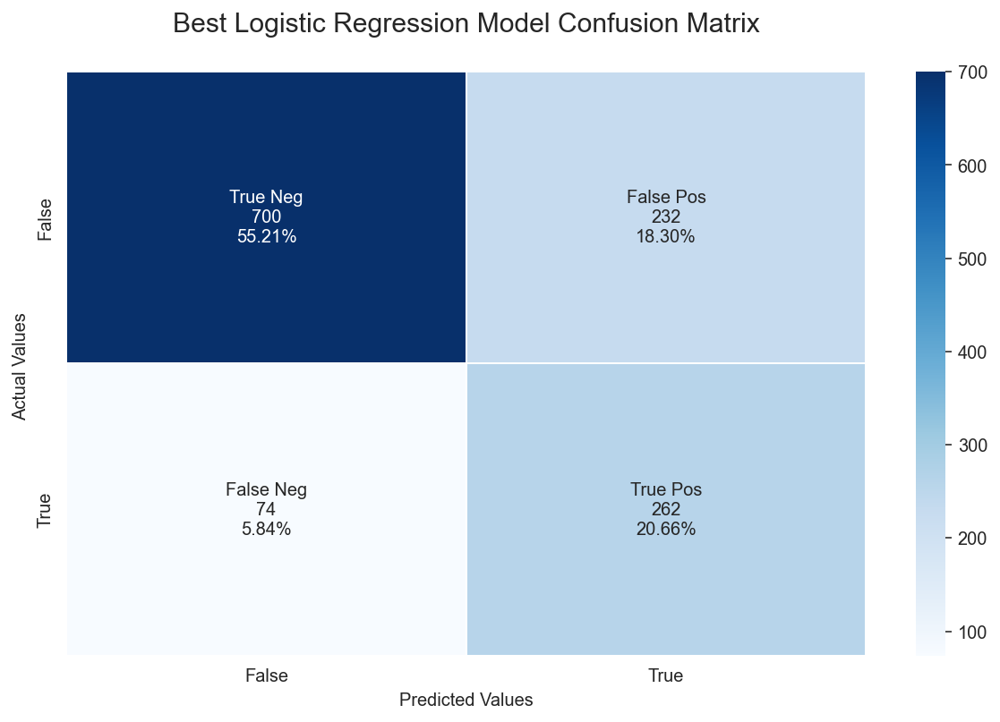

In [72]:
logreg_cm = confusion_matrix(y_test, logreg_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in logreg_cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 logreg_cm.flatten()/np.sum(logreg_cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(logreg_cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Best Logistic Regression Model Confusion Matrix\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

**From the confusion matrix we can see that:**

- There are total 700 + 232 = 932 actual non-churn values and the algorithm predicts 700 of them as non churn 
  and 232 of them as churn. 
- While there are 74 + 262 = 336 actual churn values and the algorithm predicts 74 of them as non churn 
  values and 262 of them as churn values.

**The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve. The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.**

**According to Academic Literature, in general, an AUC of 0.5 suggests no discrimination, 0.7 to 0.8 is considered acceptable, 0.8 to 0.9 is considered excellent, and more than 0.9 is considered outstanding.**

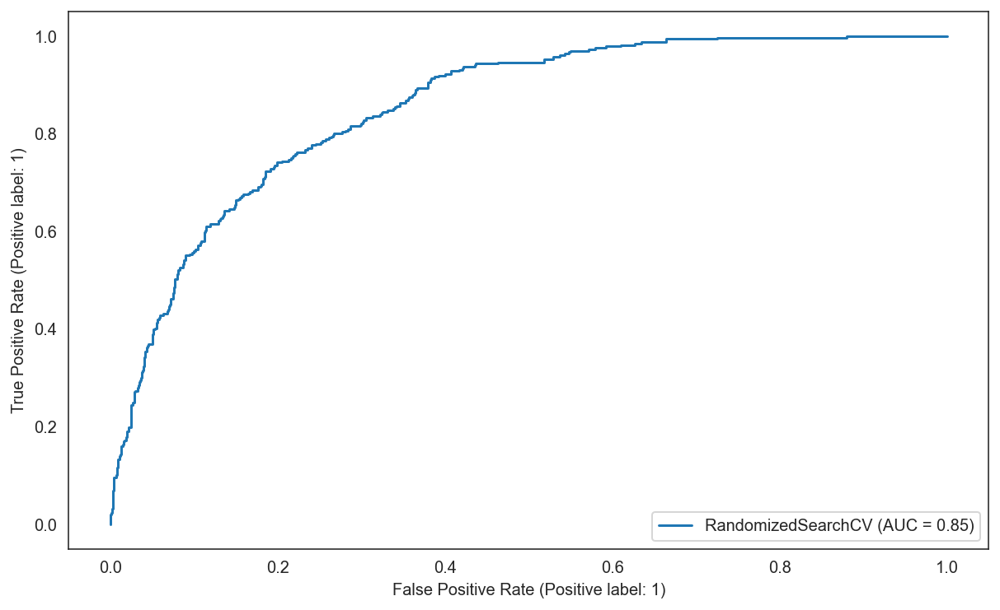

In [73]:
plot_roc_curve(logreg_randomsearch, X_test, y_test, response_method='auto');

**In our given study, the AUC score is 0.85 meaning that it can be considered as excellent since it's between 0.8 to 0.9.**

### Summary of RadomizedSearchCV modeling Logistic Regression with scaling and class weight results

In [74]:
best_logreg_model = pd.DataFrame(columns=['CV Recall', 'Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1'], 
                                 index=['Tuned-LR'])

best_logreg_model.loc['Tuned-LR', 'CV Recall'] = logreg_bestscore
best_logreg_model.loc['Tuned-LR', 'Accuracy'] = logreg_acc
best_logreg_model.loc['Tuned-LR', 'ROC-AUC'] = logreg_rocauc
best_logreg_model.loc['Tuned-LR', 'Precision'] = logreg_precision
best_logreg_model.loc['Tuned-LR', 'Recall'] = logreg_recall
best_logreg_model.loc['Tuned-LR', 'F1'] = logreg_f1
best_logreg_model

,CV Recall,Accuracy,ROC-AUC,Precision,Recall,F1
Tuned-LR,0.795,0.759,0.765,0.530,0.780,0.631


**Now, we'll tune the *'XGBoost'* model**.

### Modeling XGBoost with scaling and class weight

**Let's find best parameters with RandomizedSearchCV for our XGBoost model WITH scaling and class weight, and examine their scores visually.**

In [75]:
%%time

xgb_pipe = Pipeline([('preprocessing', ct), 
                     ('model', XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, 
                                             random_state=999, scale_pos_weight=3))])


# Define model pipeline parameter grid
xgb_param_grid = {
    'model__n_estimators': range(100, 1000),
    'model__max_depth': range(1, 10),
    'model__learning_rate': [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.05, 0.09],
    'model__min_child_weight': range(1, 10),
    'model__scale_pos_weight': range(1, 5),
    'model__subsample': [i/10.0 for i in range(1, 10)],
    'model__colsample_bytree': [i/10.0 for i in range(1, 10)]    
}

skfold = StratifiedKFold(n_splits=10, random_state=999, shuffle=True)

xgb_randomsearch = RandomizedSearchCV(xgb_pipe, param_distributions=xgb_param_grid, n_iter=25, 
                                      scoring="recall", n_jobs=-1, cv=skfold, verbose=1, random_state=999, 
                                      error_score='raise', return_train_score=True)

xgb_randomsearch.fit(X_train, y_train);

Fitting 10 folds for each of 25 candidates, totalling 250 fits
CPU times: user 5.32 s, sys: 215 ms, total: 5.53 s
Wall time: 4min 25s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('numerical',
                                                                               Pipeline(steps=[('impute',
                                                                                                SimpleImputer(add_indicator=True,
                                                                                                              strategy='median')),
                                                                                               ('scale',
                                                                                                StandardScaler())]),
                                                                               <sklearn.compose._column_transformer.make_column_sele...
                                        'model__learning_rate': [0.001, 0.002,
                                                                 0.003, 0.004,
                                                                 0.005, 0.006,
                                                                 0.007, 0.008,
                                                                 0.05, 0.09],
                                        'model__max_depth': range(1, 10),
                                        'model__min_child_weight': range(1, 10),
                                        'model__n_estimators': range(100, 1000),
                                        'model__scale_pos_weight': range(1, 5),
                                        'model__subsample': [0.1, 0.2, 0.3, 0.4,
                                                             0.5, 0.6, 0.7, 0.8,
                                                             0.9]},
                   random_state=999, return_train_score=True, scoring='recall',
                   verbose=1)

In [76]:
xgb_bestparams = xgb_randomsearch.best_params_
xgb_bestscore = xgb_randomsearch.best_score_

print(f'\nBest Parameters of RandomizedSearchCV for XGBoost Model:\n{xgb_bestparams}')
print()
print(f'-' * 75)
print(f'\nBest Estimator of RandomizedSearchCV for XGBoost Model: {xgb_bestscore}')


Best Parameters of RandomizedSearchCV for XGBoost Model:
{'model__subsample': 0.2, 'model__scale_pos_weight': 4, 'model__n_estimators': 450, 'model__min_child_weight': 5, 'model__max_depth': 3, 'model__learning_rate': 0.002, 'model__colsample_bytree': 0.2}

---------------------------------------------------------------------------

Best Estimator of RandomizedSearchCV for XGBoost Model: 0.8860420121614151


In [77]:
xgb_results = pd.DataFrame(xgb_randomsearch.cv_results_)
print(f'Best XGBoost Model Results:')
xgb_results.head()

Best XGBoost Model Results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__subsample,param_model__scale_pos_weight,param_model__n_estimators,param_model__min_child_weight,param_model__max_depth,param_model__learning_rate,param_model__colsample_bytree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,9.986,0.196,0.022,0.003,0.400,2,513,9,4,0.008,0.900,"{'model__subsample': 0.4, 'model__scale_pos_weight': 2, 'model__n_estimators': 513, 'model__min_child_weight': 9, 'model__max_depth': 4, 'model__learning_rate': 0.008, 'model__colsample_bytree': 0.9}",0.709,0.739,0.724,0.716,0.716,0.672,0.754,0.659,0.756,0.689,0.713,0.031,13,0.754,0.749,0.749,0.745,0.744,0.748,0.748,0.746,0.739,0.752,0.747,0.004
1,4.185,0.368,0.019,0.001,0.600,4,167,8,5,0.003,0.500,"{'model__subsample': 0.6, 'model__scale_pos_weight': 4, 'model__n_estimators': 167, 'model__min_child_weight': 8, 'model__max_depth': 5, 'model__learning_rate': 0.003, 'model__colsample_bytree': 0.5}",0.843,0.806,0.873,0.851,0.828,0.821,0.821,0.830,0.867,0.844,0.838,0.020,6,0.873,0.869,0.867,0.860,0.864,0.867,0.873,0.863,0.871,0.863,0.867,0.004
2,2.869,0.137,0.018,0.001,0.200,1,437,4,1,0.006,0.500,"{'model__subsample': 0.2, 'model__scale_pos_weight': 1, 'model__n_estimators': 437, 'model__min_child_weight': 4, 'model__max_depth': 1, 'model__learning_rate': 0.006, 'model__colsample_bytree': 0.5}",0.231,0.216,0.269,0.254,0.201,0.246,0.284,0.222,0.252,0.259,0.243,0.024,23,0.224,0.246,0.276,0.245,0.249,0.265,0.256,0.259,0.261,0.221,0.250,0.016
3,20.874,0.265,0.023,0.005,0.200,1,960,6,7,0.005,0.500,"{'model__subsample': 0.2, 'model__scale_pos_weight': 1, 'model__n_estimators': 960, 'model__min_child_weight': 6, 'model__max_depth': 7, 'model__learning_rate': 0.005, 'model__colsample_bytree': 0.5}",0.552,0.522,0.537,0.530,0.478,0.493,0.560,0.474,0.541,0.548,0.523,0.030,20,0.555,0.564,0.557,0.572,0.568,0.568,0.560,0.568,0.553,0.560,0.563,0.006
4,1.534,0.032,0.017,0.001,0.800,1,265,3,1,0.005,0.300,"{'model__subsample': 0.8, 'model__scale_pos_weight': 1, 'model__n_estimators': 265, 'model__min_child_weight': 3, 'model__max_depth': 1, 'model__learning_rate': 0.005, 'model__colsample_bytree': 0.3}",0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,25,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [78]:
xgb_pred = xgb_randomsearch.best_estimator_.predict(X_test)

xgb_acc = accuracy_score(y_test, xgb_pred)
xgb_rocauc = roc_auc_score(y_test, xgb_pred)
xgb_precision = precision_score(y_test, xgb_pred)
xgb_recall = recall_score(y_test, xgb_pred)
xgb_f1 = f1_score(y_test, xgb_pred)

print(f'Best XGBoost model test scores:\n')
print(f' Accuracy: {xgb_acc}')
print(f'  ROC-AUC: {xgb_rocauc}')
print(f'Precision: {xgb_precision}')
print(f'   Recall: {xgb_recall}')
print(f'       F1: {xgb_f1}')

Best XGBoost model test scores:

 Accuracy: 0.6869085173501577
  ROC-AUC: 0.7556138871857756
Precision: 0.4542728635682159
   Recall: 0.9017857142857143
       F1: 0.6041874376869392


### Classification Report

In [79]:
xgb_cr = classification_report(y_test, xgb_pred, target_names=['Retained', 'Churned'])
print(f'Best XGBoost Classification Report\n\n{xgb_cr}')

Best XGBoost Classification Report

              precision    recall  f1-score   support

    Retained       0.95      0.61      0.74       932
     Churned       0.45      0.90      0.60       336

    accuracy                           0.69      1268
   macro avg       0.70      0.76      0.67      1268
weighted avg       0.82      0.69      0.70      1268



### Confusion Matrix

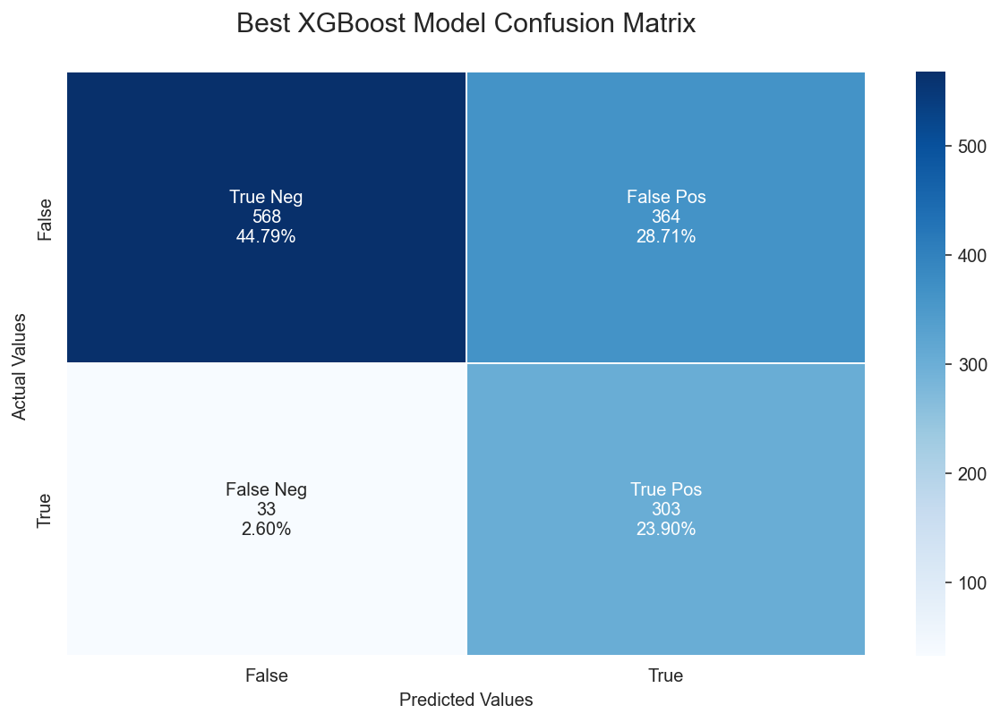

In [80]:
xgb_cm = confusion_matrix(y_test, xgb_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in xgb_cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 xgb_cm.flatten()/np.sum(xgb_cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(xgb_cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Best XGBoost Model Confusion Matrix\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

**From the confusion matrix we can see that:**

- There are total 568 + 364 = 932 actual non-churn values and the algorithm predicts 568 of them as non churn 
  and 364 of them as churn. 
- While there are 33 + 303 = 336 actual churn values and the algorithm predicts 33 of them as non churn 
  values and 303 of them as churn values.

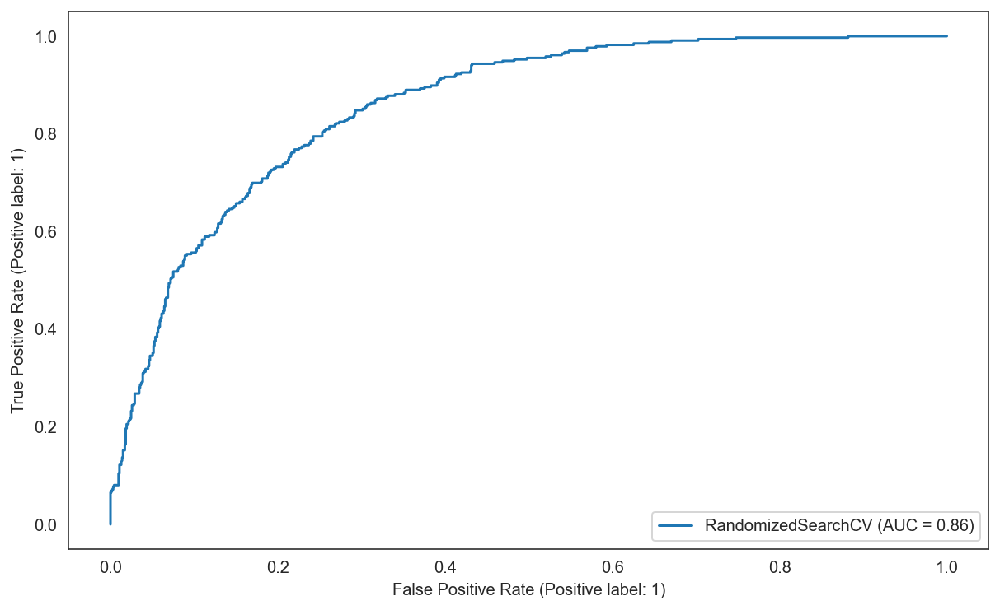

In [81]:
plot_roc_curve(xgb_randomsearch, X_test, y_test, response_method='auto');

**In our given study, the AUC score is 0.86 meaning that it can be considered as excellent since it's between 0.8 to 0.9.**

### Summary of RandomizedSearchCV modeling XGBoost with scaling and class weight results

In [82]:
best_xgb_model = pd.DataFrame(columns=['CV Recall', 'Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1'], 
                              index=['Tuned-XGBoost'])

best_xgb_model.loc['Tuned-XGBoost', 'CV Recall'] = xgb_bestscore
best_xgb_model.loc['Tuned-XGBoost', 'Accuracy'] = xgb_acc
best_xgb_model.loc['Tuned-XGBoost', 'ROC-AUC'] = xgb_rocauc
best_xgb_model.loc['Tuned-XGBoost', 'Precision'] = xgb_precision
best_xgb_model.loc['Tuned-XGBoost', 'Recall'] = xgb_recall
best_xgb_model.loc['Tuned-XGBoost', 'F1'] = xgb_f1
best_xgb_model

,CV Recall,Accuracy,ROC-AUC,Precision,Recall,F1
Tuned-XGBoost,0.886,0.687,0.756,0.454,0.902,0.604


## Compare Model Results

**Let's examine the mean CV Recall score by models.**

In [83]:
final_model_results = all_model_results.drop(['Default w/Scaling'], axis=1)
final_model_results.rename(columns={'Default w/Scaling_ClassWeight': 'Mean CV Recall'}, inplace=True)
final_model_results.loc['Tuned-LR', 'Mean CV Recall'] = logreg_bestscore
final_model_results.loc['Tuned-XGB', 'Mean CV Recall'] = xgb_bestscore
final_model_results.sort_values(by=['Mean CV Recall'], ascending=False, inplace=True)
final_model_results.style.highlight_max(color = 'lightgreen', axis = 0)

,Mean CV Recall
Tuned-XGB,0.886042
LR,0.795207
Tuned-LR,0.795207
SVC,0.784057
XGB,0.662648
ADA,0.532405
KNN,0.519779
HGB,0.514544
GB,0.506318
DT,0.495893


**The *XGB* model dramtically improved with tuning. The mean CV Recall score went from 0.662648 (XGB) to 0.886042 (Tuned-XGB), and achieves the best mean CV Recall score compared to all other models. The *'Logistic Regression'* (LR) model didn't improve with tuning (Tuned-LR). The mean CV Recall score stayed the same at 0.795207.**

In [84]:
final_model_results.sort_values(by=['Mean CV Recall'], ascending=True).iplot(kind='barh', title='Mean CV Recall Score')

**Let's examine the test scores**

In [85]:
f1_scores.append(logreg_f1)
precision_scores.append(logreg_precision)
recall_scores.append(logreg_recall)
roc_auc_scores.append(logreg_rocauc)
acc_scores.append(logreg_acc)


f1_scores.append(xgb_f1)
precision_scores.append(xgb_precision)
recall_scores.append(xgb_recall)
roc_auc_scores.append(xgb_rocauc)
acc_scores.append(xgb_acc)

model_name = ['LR', 'SVC', 'KNN', 'DT', 'RF', 'ADA', 'GB', 'HGB', 'XGB', 'Tuned-LR', 'Tuned-XGB']


model_test_results = pd.DataFrame({'F1': f1_scores, 'Precision': precision_scores, 'Recall': recall_scores,
                                   'ROC-AUC': roc_auc_scores, 'Accuracy': acc_scores}, index=model_name)

model_test_results.style.highlight_max(color = 'lightgreen', axis = 0)

,F1,Precision,Recall,ROC-AUC,Accuracy
LR,0.631325,0.530364,0.779762,0.765417,0.758675
SVC,0.634686,0.540881,0.767857,0.766439,0.765773
KNN,0.553055,0.601399,0.511905,0.694794,0.780757
DT,0.506061,0.515432,0.497024,0.664284,0.742902
RF,0.525755,0.651982,0.440476,0.677856,0.789432
ADA,0.590219,0.680934,0.520833,0.716425,0.808360
GB,0.576329,0.680162,0.500000,0.707618,0.805205
HGB,0.575251,0.656489,0.511905,0.707669,0.799685
XGB,0.595399,0.545906,0.654762,0.729205,0.764196
Tuned-LR,0.631325,0.530364,0.779762,0.765417,0.758675


**The *XGB* model dramtically improved with tuning. The Recall test score went from 0.654762 (XGB) to 0.901786 (Tuned-XGB), and achieves the best Recall test score compared to all other models. The *'Logistic Regression'* (LR) model didn't improve with tuning (Tuned-LR). The Recall test score stayed the same at 0.779762.**

In [86]:
for score in model_test_results.columns:
    model_test_results[score].sort_values().iplot(kind='barh', title=f'{score} Scores')

# Conclusion

**We have developed a resuable model pipeline, the optimized model is able to solve the business problem of predicting customer churn with given parameters. The model can be deployed - used to make predictions on new data.**

**Our Approach:**

    - We started out with a detailed exploratory data analysis of the data, analyzing the descriptive and 
      target features.
    - Next, we cleaned and prepared the data for machine learning.
    - Split the data into training and testing sets
    - We decided on models to use, our model evaluation strategy and metric selection
    - We settled on mean CV Recall score
    - We tried several different classifers
    - We compare and evaluate model results choosing best model to tune.
    - We inspected best model predicitons on hold-out test set.
    
**The aim is to predict the customers that will possibly churn so they can be put in some sort of scheme to prevent churn hence the recall measures on the 1's is of most important. Earlier during EDA, we noted that we had about 26.5% of churn, a recall greater than this baseline will already be an improvement, but we want to get as high as possible while also trying to maintain a high precision so that the bank can train its resources effectively towards clients highlighted by the model without wasting too much resources on the false positives. The threshold that our model needs to reach depends on the business need. We can tune the model threshold to some extent to optimize for different metrics.**

**In our given study, the *'XGBoost'* with the best parameters of RandomizedSearchCV achieved the best mean CV Recall score of 0.886042 out of all models and seems to be the best model for the evaluation of churn.  The model performs really well on identifying churning customers, since the recall score of 0.902 on 1's, meaning that the model is able to highlight 90.2% of all those who churn. With a precision score on 1's of 0.454, out of all customers that the model think will churn, 45.4% do actually churn. The AUC score is 0.86 meaning that it can be considered as excellent since it's between 0.8 to 0.9.**

## Save Best Model

In [87]:
best_model = xgb_randomsearch.best_estimator_

In [88]:
# Fit best model on all data
best_model.fit(X, y)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x167058f10>),
                                                 ('categorical',
                                                  Pipeline(steps=[('encode',
                                                                   OneHotEncoder(drop='if_binary',
                                                                                 handle_unknow...
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.002, max_delta_step=0,
                               max_depth=3, min_child_weight=5, missing=nan,
                               monotone_constraints='()', n_estimators=450,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=999, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=4, subsample=0.2,
                               tree_method='exact', use_label_encoder=False,
                               validate_parameters=1, verbosity=None))])

In [89]:
import joblib
joblib.dump(best_model, '../03-model/customer-churn-telco-xgbmodel-v1.pkl', compress=1)
print('Best Model Saved!!')

Best Model Saved!!


## Test (Deploy) Model

**Let's test the best model on new unseen data (i.e. the test set we split off at the beginning). Note, this test set  the model has not seen yet. This is not the same as the testing set that was used to train the model.**

## Load model

**First we need to load in the model.**

In [90]:
model = joblib.load('../03-model/customer-churn-telco-xgbmodel-v1.pkl')
model

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x166882e50>),
                                                 ('categorical',
                                                  Pipeline(steps=[('encode',
                                                                   OneHotEncoder(drop='if_binary',
                                                                                 handle_unknow...
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.002, max_delta_step=0,
                               max_depth=3, min_child_weight=5, missing=nan,
                               monotone_constraints='()', n_estimators=450,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=999, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=4, subsample=0.2,
                               tree_method='exact', use_label_encoder=False,
                               validate_parameters=1, verbosity=None))])

## Import New Data

In [91]:
# Import new data
new_data = pd.read_csv('../02-data/customer-churn-telco-testingset.csv')

In [92]:
# Let's look at the new data
new_data.head()

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,Female,1.000,Yes,Yes,61.000,Yes,Yes,DSL,No,No,Yes,No,Yes,No,One year,Yes,Electronic check,65.200,3965.050,0
1,Female,0.000,Yes,No,40.000,Yes,Yes,Fiber optic,No,No,No,Yes,No,No,Month-to-month,Yes,Credit card (automatic),78.850,3126.850,0
2,Female,0.000,Yes,Yes,10.000,Yes,No,DSL,No,Yes,No,Yes,No,Yes,Month-to-month,Yes,Electronic check,65.500,616.900,0
3,Male,0.000,No,No,57.000,Yes,No,DSL,Yes,No,Yes,No,Yes,Yes,Two year,Yes,Bank transfer (automatic),74.350,4317.350,0
4,Female,0.000,No,No,35.000,Yes,No,No,No,No,No,No,No,No,One year,No,Mailed check,21.100,741.000,0


In [93]:
X_new = new_data.drop(['churn'], axis=1)
y_new = new_data['churn']
print('The shape of X:', X_new.shape)
print('The shape of y:', y_new.shape)

The shape of X: (705, 19)
The shape of y: (705,)


## Make Predictions

In [94]:
model_pred = model.predict(X_new)

In [95]:
predictions = pd.DataFrame({'ModelPrediction': model_pred, 'ActualResult': y_new})
predictions.head()

,ModelPrediction,ActualResult
0,0,0
1,1,0
2,1,0
3,0,0
4,0,0


In [96]:
# Save test set predictions to a csv
predictions.to_csv('../02-data/customer-churn-bank-testingset-predictions.csv')

## Evaluate Predictions

**Let's compare the predictions from the model to the actual result.**

In [97]:
comparison = model_pred == y_new
np.unique(comparison, return_counts=True)

(array([False,  True]), array([232, 473]))

**Out of 705, the model correctly predicted 473 (67%) predictions, while 232 (33%) predictions the model incorrectly predicted.** 

### Confusion Matrix

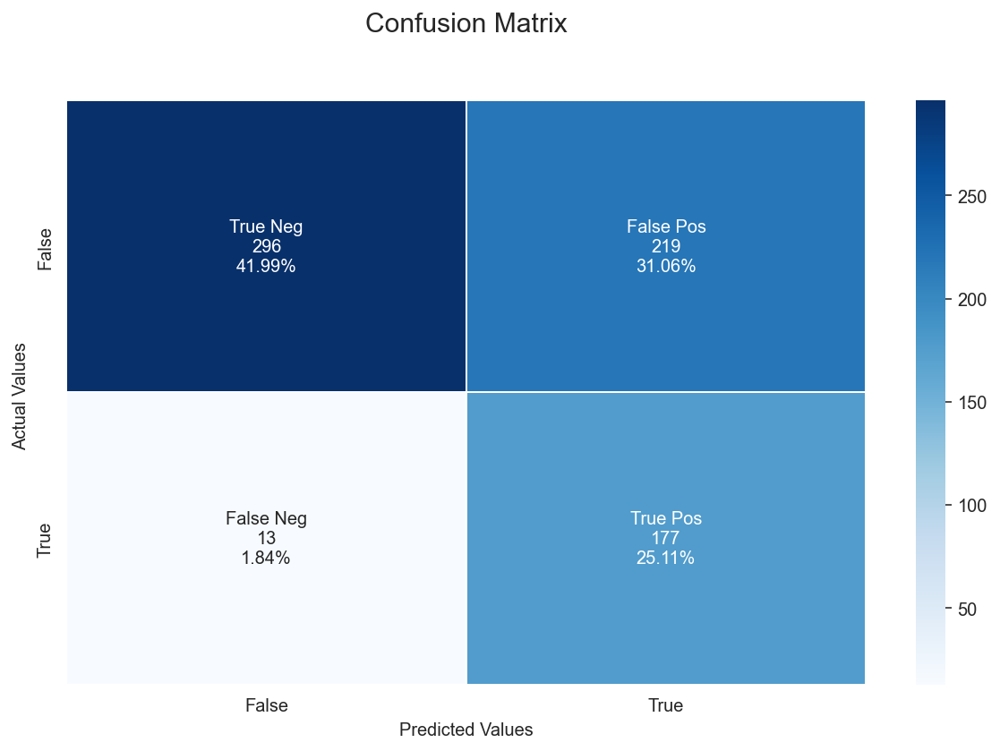

In [98]:
cm = confusion_matrix(y_new, model_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');

# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

**From the confusion matrix we can see that:**

- There are total 296 + 219 = 515 actual non-churn values and the algorithm predicts 296 of them as non churn 
  and 219 of them as churn. 
- While there are 13 + 177 = 190 actual churn values and the algorithm predicts 13 of them as non churn 
  values and 177 of them as churn values.

### Classification Report

In [99]:
cr = classification_report(y_new, model_pred, target_names=['Retained', 'Churned'])
print(f'Classification Report\n\n{cr}')

Classification Report

              precision    recall  f1-score   support

    Retained       0.96      0.57      0.72       515
     Churned       0.45      0.93      0.60       190

    accuracy                           0.67       705
   macro avg       0.70      0.75      0.66       705
weighted avg       0.82      0.67      0.69       705



## Reproducibility

In [100]:
%watermark -a 'Rainier Goubault' -n -m -v -iv

Author: Rainier Goubault

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

Compiler    : Clang 11.1.0 
OS          : Darwin
Release     : 21.1.0
Machine     : x86_64
Processor   : i386
CPU cores   : 8
Architecture: 64bit

matplotlib: 3.5.0
numpy     : 1.21.4
scipy     : 1.7.3
cufflinks : 0.17.3
seaborn   : 0.11.2
plotly    : 5.4.0
sklearn   : 1.0.1
json      : 2.0.9
joblib    : 1.1.0
pandas    : 1.3.4

